Notebook para obtener las muestras en base a imágenes satelitales y máscaras.

In [1]:
import numpy as np
import pandas as pd
from utilities import *

Cargamos los extents y glaciares. Para más información ver notebook `0_interferometria_triangulacion.ipynb`. No cargamos las máscaras ni las matrices de velocidad ya que estas están vinculadas a la matriz de interferometría, por lo que debemos que recalcularalas.

In [16]:
# Se agrega el extent de los tif a procesar
extent_tif_1 = pd.read_csv("https://github.com/alcazar90/rock-glacier-detection/raw/main/data/extents/extent_tif_1.tsv",
                          header = None).to_numpy()

glaciares = {f"glaciar_{n}": pd.read_csv(f"https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/\
glaciares/glaciar_{n}_strict.tsv", sep="\t", header=None).to_numpy()[:-1, [1,0]] for n in range(1, 7)}

glaciares_list = list(glaciares.values())

con_glaciares = {f"glaciar_area_{n}": pd.read_csv(f"https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/\
data/glaciares/glaciar_area_{n}.tsv", sep="\t", header=None).to_numpy()[:-1, [1,0]] for n in range(1, 5)}
con_glaciares["argentina"] = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/\
data/glaciares/argentina.tsv", sep="\t", header=None).to_numpy()[:-1, [1,0]]

con_glaciares_list = list(con_glaciares.values())

Creamos los colormaps

In [7]:
colors = np.column_stack((np.ones((256, 3)), np.linspace(0, 1, 256)))
alpha = LinearSegmentedColormap.from_list(name = "alpha", colors=colors)
glow = LinearSegmentedColormap.from_list(name = "glow", colors=colors*np.array([0.97, 0.58, 0.2, 1]))
danger = LinearSegmentedColormap.from_list(name = "danger", colors=colors*np.array([0.85, 0.2, 0.45, 1]))
sky = LinearSegmentedColormap.from_list(name = "sky", colors=colors*np.array([0.25, 0.45, 0.95, 1]))

colors2 = np.array([[0, .95, 1,1], [0,0,0,1], [.75,.9,0,1]])
fluor = LinearSegmentedColormap.from_list(name = "fluor", colors=colors2)

# GeoTiff
Importamos librería GeoTiff para trabajar con las imágenes satelitales. Se puede usar rasterio también. Para ello, se obtienen las matrices asociadas a los geotiff, se extraen los 3 primeros canales y luego se continúa análogamente.

In [10]:
from geotiff import GeoTiff

In [8]:
import os
datasets_folder = "../data/dataset/polygon_images/"
os.listdir(datasets_folder)

['RT_L1C_T19JDJ_A035557_20220413T144923.tif',
 'RT_T19JDJ_A035986_20220513T144515.tif',
 'RT_T19JDJ_A036129_20220523T144523.tif',
 'RT_T19JDJ_A036415_20220612T144942.tif',
 'RT_T19JDJ_A036844_20220712T144937.tif',
 'RT_T19JDJ_A036987_20220722T144921.tif',
 'RT_T19JDJ_A037559_20220831T144448.tif',
 'RT_T19JDJ_A037702_20220910T144450.tif',
 'RT_T19JDJ_A037845_20220920T144943.tif',
 'RT_T19JDJ_A037988_20220930T145022.tif']

Datasets es una lista con los GeoTiff de la carpeta dataset/polygon_images en formato tensor RGB. Para esto cargamos cada imágen y luego obtenemos los 3 primeros canales de cada tensor.

In [11]:
dataset_files = os.listdir(datasets_folder)
datasets = [np.array(GeoTiff(datasets_folder + file).read()) for file in dataset_files]

In [12]:
datasets = [dataset[:, :, :3] for dataset in datasets]

In [13]:
datasets[0].shape

(4222, 3688, 3)

Visualizamos la primera imágen para corroborar.

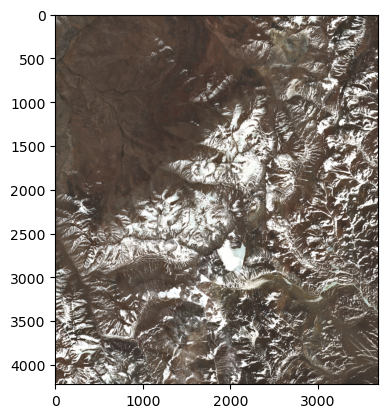

In [14]:
plt.imshow(datasets[9][:,:,:3])

# Triangulación y obtención de máscaras
Como las máscaras obtenidas previamente en `0_interferometria_triangulacion.ipynb` corresponden a las dimensiones y extent de las matrices de interferometría y las imágenes satelitales tienen tanto otro extent cómo otro tamaño (4222 x 3688) se deben rehacer las triangulaciones.

**Para cargar directamente las máscaras, saltarse las 2 siguientes celdas**

In [17]:
en_glaciar_tif = []
for glaciar in glaciares:
    print("Triangulando", glaciar)
    en_glaciar_tif.append(matrix_polygon((4222, 3688), extent_tif_1, glaciares[glaciar]))
    
en_glaciar_tif = np.any(en_glaciar_tif, axis=0)
np.save("../data/masks/en_glaciar_tif_z1", en_glaciar_tif)

Triangulando glaciar_1
Triangulando glaciar_2
Triangulando glaciar_3
Triangulando glaciar_4
Triangulando glaciar_5
Triangulando glaciar_6


In [18]:
sin_glaciar_tif = []
for glaciar in con_glaciares:
    print("Triangulando", glaciar)
    sin_glaciar_tif.append(matrix_polygon((4222, 3688), extent_tif_1, con_glaciares[glaciar]))
    
sin_glaciar_tif = np.logical_not(np.any(sin_glaciar_tif, axis=0))
np.save("../data/masks/sin_glaciar_tif_z1", sin_glaciar_tif)

Triangulando glaciar_area_1
Triangulando glaciar_area_2
Triangulando glaciar_area_3
Triangulando glaciar_area_4
Triangulando argentina


Cargamos directamente las máscaras ya precomputadas.

In [20]:
en_glaciar_tif  = np.load("../data/masks/en_glaciar_tif_z1.npy")
sin_glaciar_tif = np.load("../data/masks/sin_glaciar_tif_z1.npy")

Creamos un mapper alternativo con el extent y dimensiones de los geotiff. Esta vez el proceso es más lento ya que las imágenes son levemente trapezoidales, por lo que se deben precomputar las transformaciones a realizar para graficar las imágenes.

In [22]:
mapper_tif = mapper(extent_tif_1, datasets[0][:, :, 0].shape)

Por cómo funciona mapper, por el momento sólo puede graficarse un canal. Lo realizamos para corroborar que las triangulaciónes hayan sido correctas.

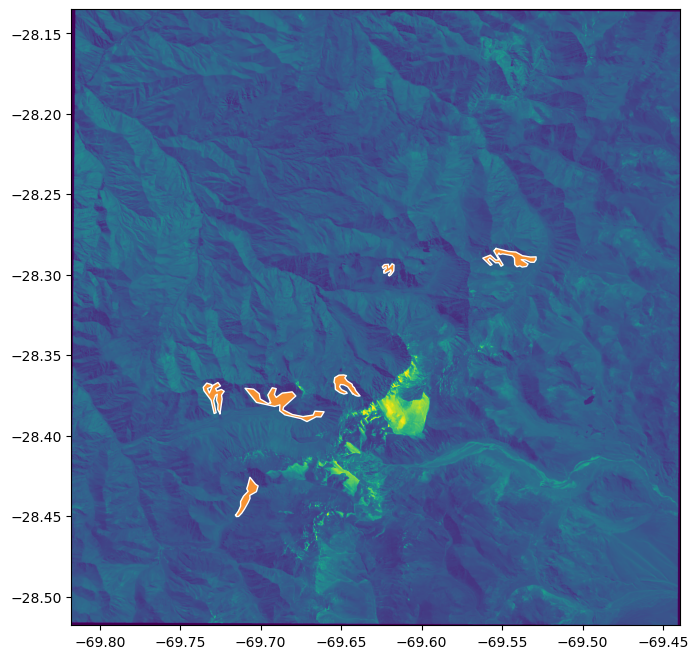

In [24]:
mapper_tif.draw([datasets[0][:, :, 0], en_glaciar_tif], glaciares = glaciares_list, linewidth=1, 
                cmaps=["viridis", glow])

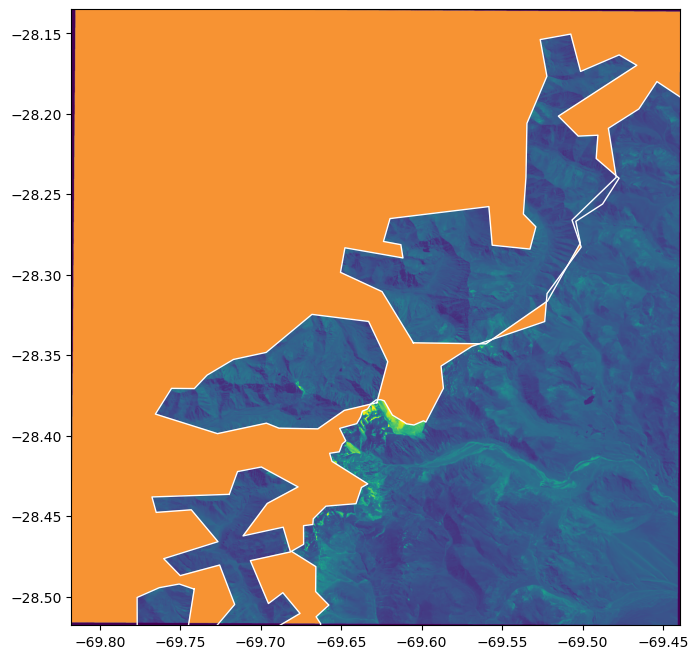

In [26]:
mapper_tif.draw([datasets[0][:, :, 0], sin_glaciar_tif], glaciares = con_glaciares_list, linewidth=1,
                cmaps=["viridis", glow], force_extent = True)

# Ensanchamiento de máscaras

Utilizaremos las máscaras para determinar los centros de las muestras. Pero para esto nos debemos preocupar de 2 asuntos.

En primer lugar, las muestras de clase no glaciar no pueden tener ningún pixel que esté dentro de las áreas con posibles glaciares. Para esto, vamos a "ensanchar" estas áreas, de manera tal que todo pixel a menos de n/2 pixeles de las zonas con posibles glaciares no pueda ser elegido como centro, con n = el tamaño de las muestras.

Por otro lado, nos gustaría que el dataset que contiene glaciares no esté siempre centrado en un glaciar, de manera de forzar a la red neuronal a encontrar el patrón correspondiente. Para esto también ensancharemos los glaciares un cierto valor, de manera que las muestras puedan estar centradas un poco más lejos.

En un principio, tomaremos muestras de tamaño 128 x 128, por lo que ensancharemos en 64 pixeles las áreas con posibles glaciares y en 24 pixeles a los polígonos con glaciares. Por como fué construida la función, esta ensancha las areas False. Para `sin_glaciar` esto está bien ya que las zonas False son aquellas con posibles glaciares, de manera que estaríamos adelgazando las zonas sin glaciares. Para `en_glaciar` debemos ensanchar el complemento.

In [27]:
broad_sin_glaciar_tif = broaden_mask(sin_glaciar_tif, 64)

In [28]:
broad_en_glaciar_tif = np.logical_not(broaden_mask(np.logical_not(en_glaciar_tif), 24))

Visualizamos para corroborar.

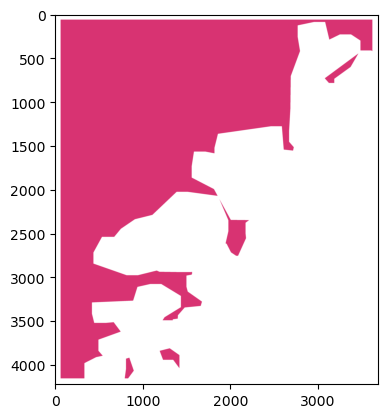

In [30]:
plt.imshow(broad_sin_glaciar_tif, cmap = danger)

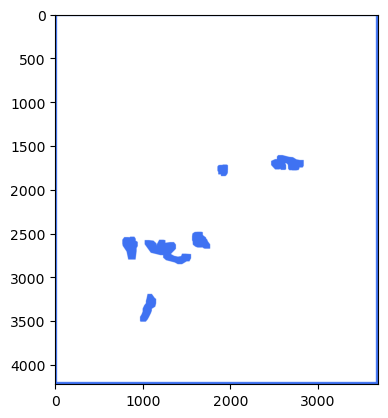

In [31]:
plt.imshow(broad_en_glaciar_tif, cmap = sky)

# Generación de centros

El muestreo lo dividiremos en 2 etapas. En primer lugar eligiremos los centros (o en realidad las coordenadas completas de los cuadrados) de las muestras a tomar. Hacemos esto de manera que sea poco probable que se tomen muchas muestras del mismo lugar. Para esto, cada pixel elegible tiene un peso, y luego de cada muestreo, el cuadrado tomado lse divide por un decay matrix controlado por 2 argumentos (weight_decay y power, por defecto 100 y 1) que disminuye la probabilidad de volver a usar los puntos del cuadrado como centro, con mayor penalización a los pixeles del centro.

La función devuelve también los pesos luego de todo el proceso (la matriz "mordida"), de manera que podemos observar si fue efectivo. 

### Clase no glaciar

Primero generamos los centros de las muestras de clase no glaciar.

In [33]:
samples_sin_bite, samples_sin =generate_samples(broad_sin_glaciar_tif, size = 128, n_samples = 1000)

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950


Graficamos los centros obtenidos junto con los pesos al final de todo el proceso de muestreo.

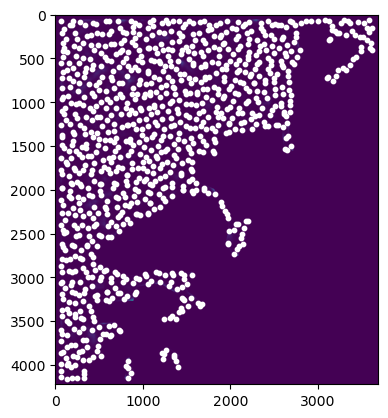

In [34]:
plt.imshow(samples_sin_bite)

a = (samples_sin[:,0]+samples_sin[:,1])/2, (samples_sin[:,2]+samples_sin[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

Vemos que prácticamente todos los pesos son uniformemente bajos, salvo por algunas excepciones. 

### Clase glaciar

Luego muestrearemos en las areas con glaciares. Para esto separaremos la matriz en 3 áreas. Esto netamente con fines de eficiencia computacional, ya que el muestreo de centros es un proceso muy lento.

In [35]:
broad_glaciar_1 = broad_en_glaciar_tif[1500:1950, 1730:2950]
broad_glaciar_2 = broad_en_glaciar_tif[2370:2970, 650:1900]
broad_glaciar_3 = broad_en_glaciar_tif[3080:3630, 860:1270]

Muestreamos la zona 1

In [36]:
samples_glaciar1_bite, samples_glaciar1 = generate_samples(broad_glaciar_1, size = 128, n_samples = 260, weight_decay=1.5)

0
50
100
150
200
250


Graficamos

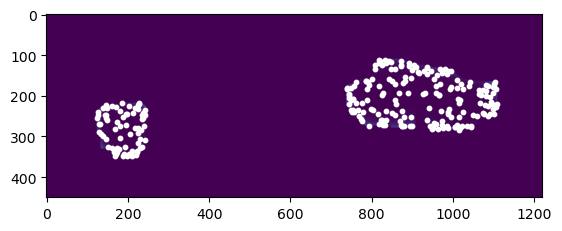

In [37]:
plt.imshow(samples_glaciar1_bite)

a = (samples_glaciar1[:,0]+samples_glaciar1[:,1])/2, (samples_glaciar1[:,2]+samples_glaciar1[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

Luego la zona 2.

0
50
100
150
200
250
300
350
400


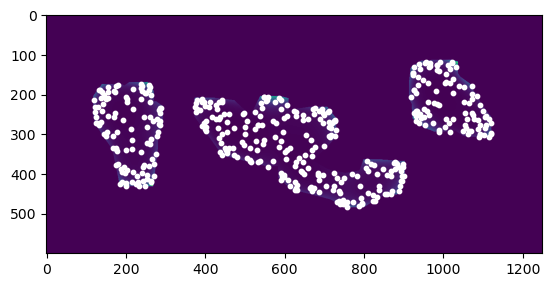

In [39]:
samples_glaciar2_bite, samples_glaciar2 =generate_samples(broad_glaciar_2, size = 128, n_samples = 430, weight_decay=1.5)

plt.imshow(samples_glaciar2_bite)

a = (samples_glaciar2[:,0]+samples_glaciar2[:,1])/2, (samples_glaciar2[:,2]+samples_glaciar2[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

Zona 3.

0
50
100


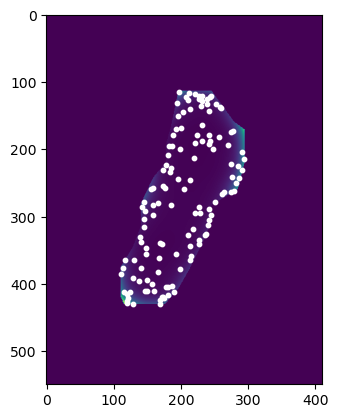

In [40]:
samples_glaciar3_bite, samples_glaciar3 =generate_samples(broad_glaciar_3, size = 128, n_samples = 130, weight_decay=1.5)

plt.imshow(samples_glaciar3_bite)

a = (samples_glaciar3[:,0]+samples_glaciar3[:,1])/2, (samples_glaciar3[:,2]+samples_glaciar3[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

Podemos ver cómo quedaron algunas zonas con pesos altos, por lo que la máscara está realmente "mordida".

Concatenamos las muestras obtenidas. Para esto primero debemos transformarlas a sus coordenadas correspondientes, para revertir la separación de la máscara en 3 submáscaras.

In [41]:
samples_glaciar1_fit = samples_glaciar1 + np.array([1500, 1500, 1730, 1730])
samples_glaciar2_fit = samples_glaciar2 + np.array([2370, 2370,  650,  650])
samples_glaciar3_fit = samples_glaciar3 + np.array([3080, 3080,  860,  860])

samples_glaciar = np.concatenate([samples_glaciar1_fit, samples_glaciar2_fit, samples_glaciar3_fit])

Graficamos todo, para corroborar que los centros fueron concatenados correctamente.

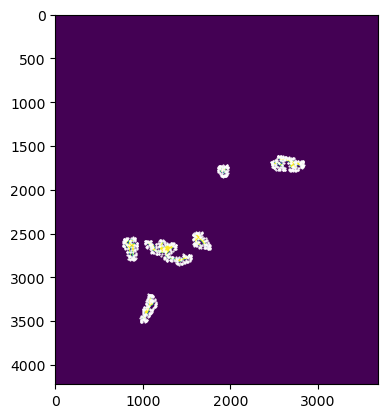

In [42]:
plt.imshow(en_glaciar_tif)

a = (samples_glaciar[:,0]+samples_glaciar[:,1])/2, (samples_glaciar[:,2]+samples_glaciar[:,3])/2
plt.scatter(a[1], a[0], color="white", s=.3)

# Muestreo de imágenes.
Finalmente, utilizando las imágenes del dataset y los centros obtenidos generaremos muestras de estas imágenes centradas en los centros. Para esto, por cada centro la función elige aleatoreamente una de las 10 imágenes (en 10 épocas distintas del año) y le aplica una de 4 rotaciones y una de 2 flips, produciendo un total de 80 posibilidades por centro, constituyendo una forma de data augmentation.

Comenzaremos sampleando las imágenes de glaciar. La función también toma la matriz de mask, de manera que al mismo tiempoq que genera una muestra de las imágenes, genera también su máscara, por lo que podemos luego identificar qué parte de la muestra supuestamente contiene el glaciar.

In [43]:
images_glaciar, masks_glaciar = sample_images(samples_glaciar, en_glaciar_tif, datasets)

Visualizamos las muestras generadas.

**Ojo: Estas no son las imágenes utilizadas para entrenar, ya que estas fueron re-generadas en el proceso de creación de este notebook.** Las imágenes originales se encuentran visualizadas en `old_notebook.ipynb` o directamente en /data/ds2

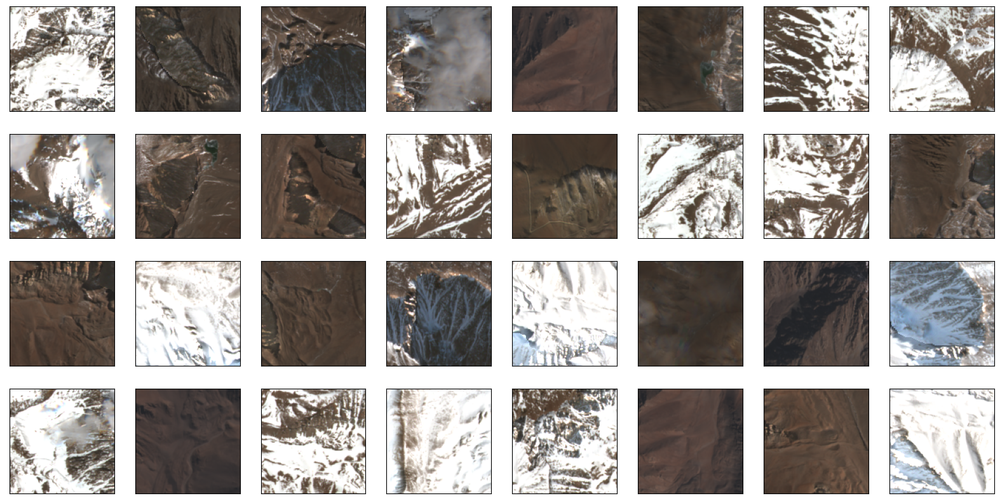

In [44]:
fig, axes = plt.subplots(4, 8, figsize = (20,10))
axes = axes.flatten()
for ax, img in zip(axes, images_glaciar):
    ax.imshow(img[:, :, :3], cmap = sky)
    ax.set_xticks([])
    ax.set_yticks([])

Visualizaremos los masks generados. Si se comparan las grillas de la casilla superior e inferior, uno se percata donde efectivamente está el glaciar de roca. Se puede observar cómo efectivamente muchas muestras no etán centradas en el glaciar.

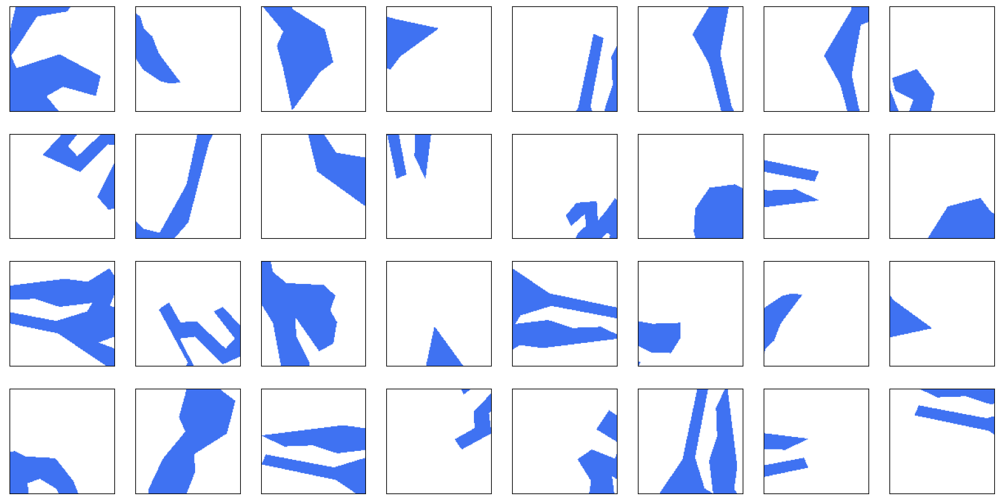

In [46]:
fig, axes = plt.subplots(4, 8, figsize = (20,10))
axes = axes.flatten()
for ax, img in zip(axes, masks_glaciar):
    ax.imshow(img, cmap = sky)
    ax.set_xticks([])
    ax.set_yticks([])

Finalmente, generamos y visualizamos las imágenes de la clase sin glaciar. Acá no tiene utilidad visualizar las masks ya que son uniformes.

In [48]:
images_sin, masks_sin = sample_images(samples_sin, en_glaciar_tif, datasets)

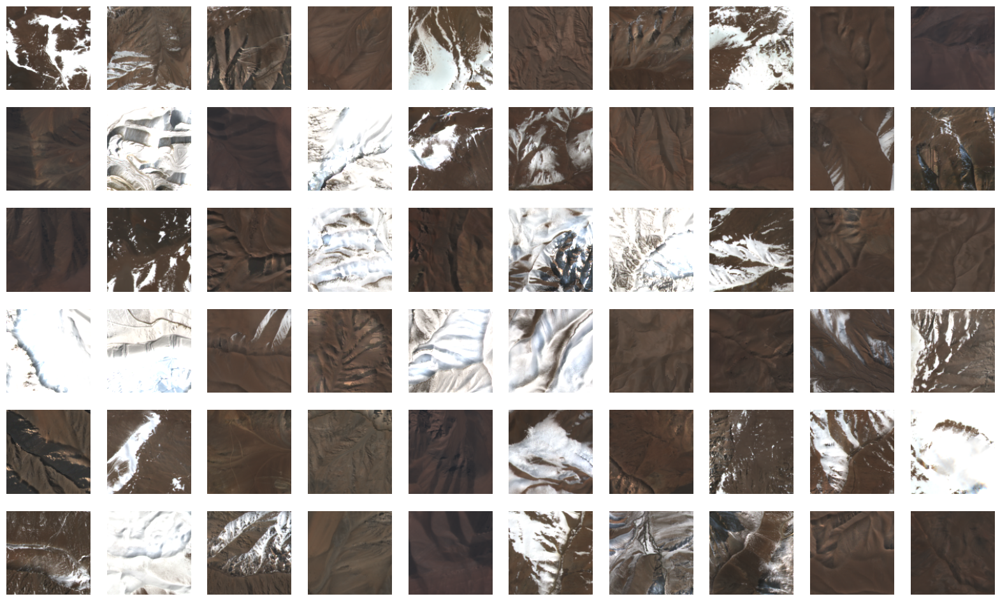

In [49]:
fig, axes = plt.subplots(6, 10, figsize = (20,12))
axes = axes.flatten()
for ax, img in zip(axes, images_sin):
    ax.imshow(img)
    ax.axis("off")

**Se han ocultado las celdas donde se guardan las muestras para evitar sobreescribirlas**

# Resampling

Luego de la generación del dataset 2, se buscó mejorar este. Muchas de las muestras contenían sólo una pequeña parte del glaciar, en el cual muchas veces no es reconocible donde está este. Adicionalmente, en los modelos entrenados se amplificaron a 256x256, por lo que generamos muestras más grandes con el mismo ensanchamiento para los glaciares, asegurándonos que una mayor porción del glaciar quedara en la muestra. También tomamos una mayor cantidad de muestra asegurandonos que haya una menor proporción de imágenes de mala calidad. De esta forma, se generó el **dataset 3**, presente en data/ds3.

Cargamos las máscaras de nuevo e importamos librerías de nuevo, para permitir comenzar desde acá la ejecución del notebook.

In [51]:
import numpy as np
import pandas as pd
from utilities import *

en_glaciar_tif  = np.load("en_glaciar_tif_z1.npy")
sin_glaciar_tif = np.load("sin_glaciar_tif_z1.npy")

### Clase glaciar

Comenzamos con los glaciares. Ensanchamos, separamos en 3 sub máscaras.

In [52]:
broad_en_glaciar_tif = np.logical_not(broaden_mask(np.logical_not(en_glaciar_tif), 24))

broad_glaciar_1 = broad_en_glaciar_tif[1500:1950, 1730:2950]
broad_glaciar_2 = broad_en_glaciar_tif[2370:2970, 650:1900]
broad_glaciar_3 = broad_en_glaciar_tif[3080:3630, 860:1270]

Obtenemos los centros de las 3 sub máscaras. No visualizaremos en cada paso ya que es redundante a la sección anterior. Esta vez uitilizamos power = 5 (por defecto es 1), lo cual hace que el decaimiento de pesos esté más concentrado al centro del cuadrado tomado. También tomaremos imágenes de tamaño 256x256 y una mayor cantidad de imágenes. Pasamos de 260, 430, 130 a 260, 500, 180 imágenes del sector 1, 2 y 3 respectivamente. 

In [53]:
samples_glaciar1_bite, samples_glaciar1 =generate_samples(broad_glaciar_1, size = 256, 260, weight_decay=1.5, power = 5)
samples_glaciar2_bite, samples_glaciar2 =generate_samples(broad_glaciar_2, size = 256, 500, weight_decay=1.5, power = 5)
samples_glaciar3_bite, samples_glaciar3 =generate_samples(broad_glaciar_3, size = 256, 180, weight_decay=1.5, power = 5)

0
50
100
150
200
250
0
50
100
150
200
250
300
350
400
450
0
50
100
150


Concatenamos y ahora sí visualizamos.

In [54]:
samples_glaciar1_fit = samples_glaciar1 + np.array([1500, 1500, 1730, 1730])
samples_glaciar2_fit = samples_glaciar2 + np.array([2370, 2370,  650,  650])
samples_glaciar3_fit = samples_glaciar3 + np.array([3080, 3080,  860,  860])

resamples_glaciar = np.concatenate([samples_glaciar1_fit, samples_glaciar2_fit, samples_glaciar3_fit])

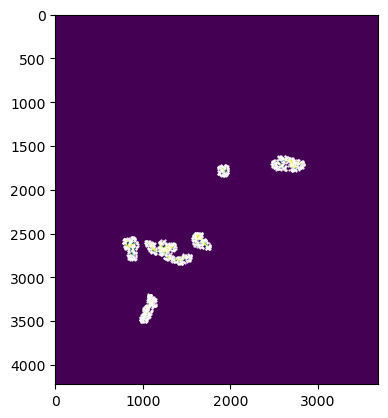

In [55]:
plt.imshow(en_glaciar_tif)

a = (resamples_glaciar[:,0]+resamples_glaciar[:,1])/2, (resamples_glaciar[:,2]+resamples_glaciar[:,3])/2
plt.scatter(a[1], a[0], color="white", s=.3)

Generamos las imágenes y las visualizamos. Adicionalmente, le asignaremos pesos asimétricos a las imágenes. Una de las imágenes presenta alta nubosidad, lo que no sólo complica la labor de limpieza manual, sino que además hace que el muestreo sea menos eficiente. Le asignaremos probabilidad cero a dicha imágen (la imágen 8). También le asignaremos menos peso a las imágenes con mucha nieve, ya que no se distinguen bien los glaciares.

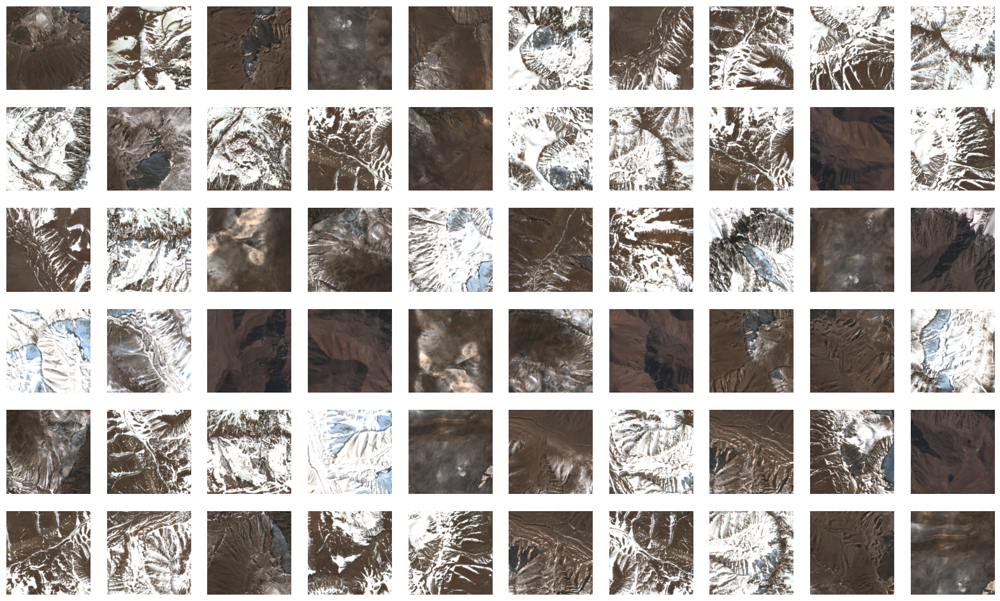

In [56]:
re_images_glaciar, re_masks_glaciar = sample_images(resamples_glaciar, en_glaciar_tif, 
                                                    datasets, weights =[10, 10, 10, 10, 6, 4, 8, 0, 10, 10])

fig, axes = plt.subplots(6, 10, figsize = (20,12))
axes = axes.flatten()
for ax, img in zip(axes, re_images_glaciar):
    ax.imshow(img)
    ax.axis("off")

Vemos las masks

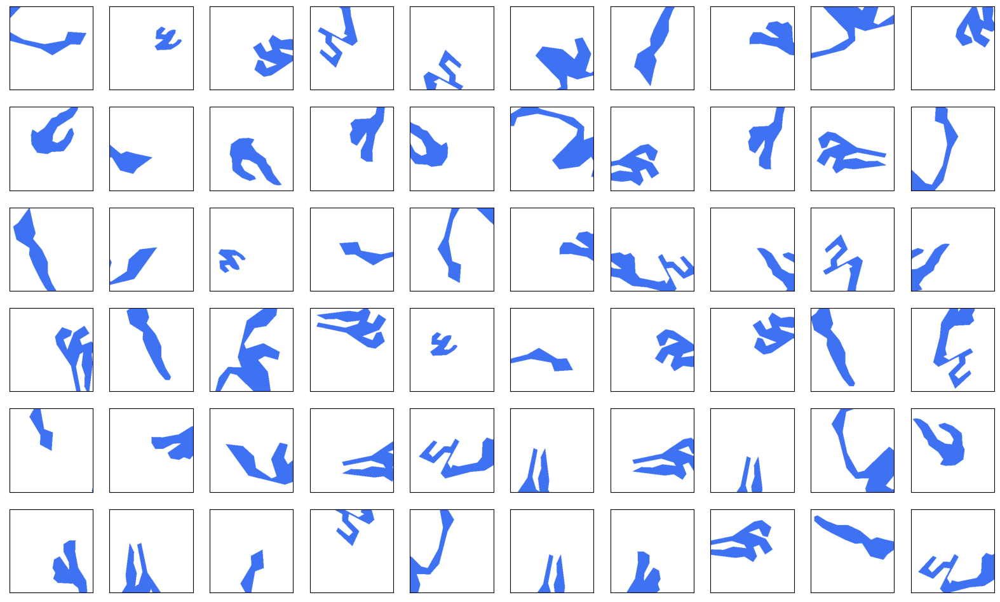

In [65]:
fig, axes = plt.subplots(6, 10, figsize = (20,12))
axes = axes.flatten()
for ax, img in zip(axes, re_masks_glaciar):
    ax.imshow(img, cmap = sky)
    ax.set_xticks([])
    ax.set_yticks([])

In [61]:
len(re_images_glaciar)

940

Vemos que esta vez sí hay una porción mucho más grande del glaciar en la muestra. También no se observan nubes. Sí hay otro tipo de imágenes de mala calidad que tuvieron que ser limpiadas.

### Clase no glaciar

Finalmente, resampleamos la clase sin glaciar. Comenzamos ensanchando la máscara sin glaciar (o adelgazándola, realmente). En vez de adelgazarla en 64, la adelgazamos en 128 por el aumento del tamaño de las muestras.

In [58]:
broad_sin_glaciar_tif = broaden_mask(sin_glaciar_tif, 128)

Como esta es distinta a la anterior, la re visualizamos.

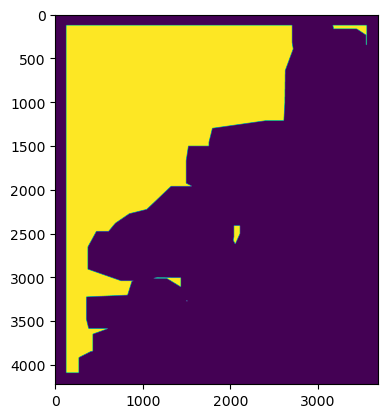

In [59]:
plt.imshow(broad_sin_glaciar_tif)

Vemos que los espacios entre areas con glaciares son mucho más estrechos. Tomamos los centros y visualizamos. Tambbién aumentamos power, aunque el área sin glaciares es tan grande que no hace mucha diferencia.

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950


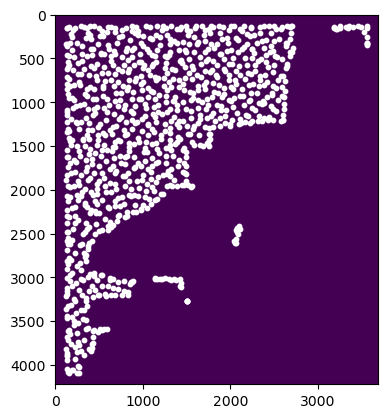

In [60]:
re_samples_sin_bite, re_samples_sin =generate_samples(broad_sin_glaciar_tif, size = 256, n_samples = 1000, power=2)

plt.imshow(re_samples_sin_bite)

a = (re_samples_sin[:,0]+re_samples_sin[:,1])/2, (re_samples_sin[:,2]+re_samples_sin[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

Sampleamos imágenes y visualizamos. Utilizamos pesos simétricos, ya que no hay problema si una imágen de clase no glaciar tiene una nube.

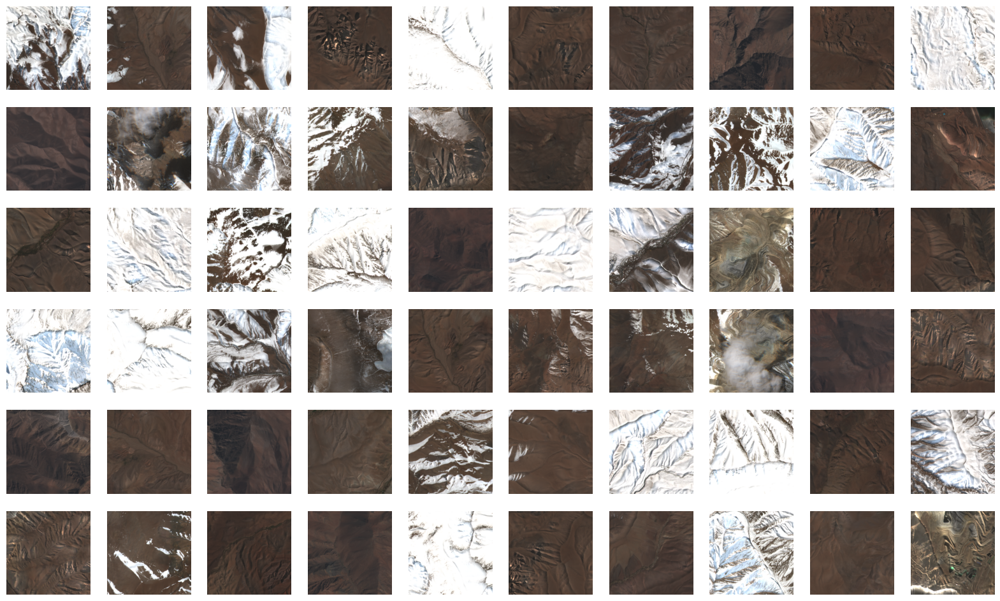

In [62]:
re_images_sin, re_masks_sin = sample_images(re_samples_sin, en_glaciar_tif, datasets)

fig, axes = plt.subplots(6, 10, figsize = (20,12))
axes = axes.flatten()
for ax, img in zip(axes, re_images_sin):
    ax.imshow(img)
    ax.axis("off")

# Huasco